<a href="https://colab.research.google.com/github/PhuphaB/Data-Analytics/blob/main/Loan_Default_Prediction_(Group_9).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install summarytools
!pip install skimpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.8/28.8 MB 45.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 16.0 MB/s eta 0:00:00
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.4.1
    Uninstalling typeguard-4.4.1:
      Successfully uninstalled typeguard-4.4.1
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 17.0.0
    Uninstalling pyarrow-17.0.0:
      Successfully uninstalled pyarrow-17.0.0
  Attempting uninstall: polars
    Found existing installation: polars 1.9.0
    Uninstalling polars-1.9.0:
      Successfully uninstalled polars-1.9.0
  Attempting uninstall: ipykernel
    Found existing installation: ipykernel 5.5.6
    Uninstalling ipykernel-5.5.6:
      Successfully uninstalled ipykernel-5.5.6
ERROR: pip's dependency resolver does not curr

In [ ]:
# Loading Loan Dataset

#df = pd.read_csv('dataset/LoanDataset - LoansDatasest.csv')
df= pd.read_csv('//content/LoanDataset.csv')

In [ ]:
df.shape

(32586, 13)

In [ ]:
df.head()

,customer_id,customer_age,customer_income,home_ownership,employment_duration,loan_intent,loan_grade,loan_amnt,loan_int_rate,term_years,historical_default,cred_hist_length,Current_loan_status
0,1.0,22,59000,RENT,123.0,PERSONAL,C,"£35,000.00",16.02,10,Y,3,DEFAULT
1,2.0,21,9600,OWN,5.0,EDUCATION,A,"£1,000.00",11.14,1,NaN,2,NO DEFAULT
2,3.0,25,9600,MORTGAGE,1.0,MEDICAL,B,"£5,500.00",12.87,5,N,3,DEFAULT
3,4.0,23,65500,RENT,4.0,MEDICAL,B,"£35,000.00",15.23,10,N,2,DEFAULT
4,5.0,24,54400,RENT,8.0,MEDICAL,B,"£35,000.00",14.27,10,Y,4,DEFAULT


In [ ]:
df.columns

Index(['customer_id', 'customer_age', 'customer_income', 'home_ownership',
       'employment_duration', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'term_years', 'historical_default', 'cred_hist_length',
       'Current_loan_status'],
      dtype='object')

In [ ]:
# +SS
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32586 entries, 0 to 32585
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   customer_id          32583 non-null  float64
 1   customer_age         32586 non-null  int64  
 2   customer_income      32586 non-null  object 
 3   home_ownership       32586 non-null  object 
 4   employment_duration  31691 non-null  float64
 5   loan_intent          32586 non-null  object 
 6   loan_grade           32586 non-null  object 
 7   loan_amnt            32585 non-null  object 
 8   loan_int_rate        29470 non-null  float64
 9   term_years           32586 non-null  int64  
 10  historical_default   11849 non-null  object 
 11  cred_hist_length     32586 non-null  int64  
 12  Current_loan_status  32582 non-null  object 
dtypes: float64(3), int64(3), object(7)
memory usage: 3.2+ MB


In [ ]:
from summarytools import dfSummary
dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,customer_id[float64],Mean (sd) : 16289.5 (9405.9)min < med < max:1.0 < 16288.0 < 32581.0IQR (CV) : 16289.0 (1.7),"32,577 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAABxklEQVR4nO3XQU7CYBBA4fkbJSCkDSHCAbwBSw7hYT0EJ2DhxhU7EtKUUDEarCcAKTXqS963baczixcSUtM0If132V8fIF3i5rsXUkqDiOhd+f0sIj6vnO06T91Nvbvr/HvTNIdTD8+GmlIaTCaTxzzPx223Ho/H27quH0aj0UuWZR+/OU/dTb37J+Z3u12ZUno6Fet3v6i9PM/Hi8XiUBTFW5vF6/V6vFqt7ufz+fNsNivbzHadp+6m3t11vqqq/nK5HG+3215EXBVqREQURfE2nU5f2ywvy3IQETEcDlvPdp2n7qbe/RPzETE499A/U0IwVCEYqhAMVQiGKgRDFYKhCsFQhWCoQjBUIRiqEAxVCIYqBEMVgqEKwVCFYKhCMFQhGKoQDFUIhioEQxWCoQrBUIVgqEIwVCEYqhAMVQiGKgRDFYKhCsFQhWCoQjBUIRiqEAxVCIYqBEMVgqEKwVCFYKhCMFQhGKoQDFUIhioEQxWCoQrBUIVgqEIwVCEYqhAMVQiGKgRDFYKhCsFQhWCoQjBUIRiqEAxVCIYqBEMVgqEK4eaSl6qq6rf98H6/70dE1HXd32w2d785T91Nvbvr/CV9fQGSljnmc7n3zQAAAABJRU5ErkJggg=="">",3(0.0%)
2,customer_age[int64],Mean (sd) : 27.7 (6.4)min < med < max:3.0 < 26.0 < 144.0IQR (CV) : 7.0 (4.4),62 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAAB/0lEQVR4nO3azaraUBSG4bWqx26PNEGEOPMSOnDoRfRiz7TzXIsIQRPMMY3o7qjD/iQq5jt9n/naLMJLJLg9xmjA0H169gLAvxg/8nB3n5rZ5IYj2hjj6V77QNfDQnX36WKx+JYkybzvGVVV7d39jVjxyDfqJEmS+WazOaVp2nQdLssy5Hk+L4piYmaE+p976E+/mVmapk2WZe89x6d3XQay+JiCBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFBEKFhPGzF/iTy+XyYmaJu/cZb2OMpzuvhCcZbKh1Xb+cz+evq9VqNBqNmq7zVVXt3f2NWD+GwYbatu04hPC6Xq+b5XK57zJblmXI83xeFMXEzAj1AxhsqL/MZrMmy7L3HqPTuy+Dp+FjChIIFRIIFRIIFRIIFRIIFRIIFRIIFRIIFRIIFRIG/xdqXzfevDLj9tWg/DVUdw9m9rnH2cn1eh2XZRl6zNrxeAxmZnVdh91u99pldrvdfrnl5pWZ2eFwOLr7dzPrNY/OfsQYf/usfwIC/XF51eO2tgAAAABJRU5ErkJggg=="">",0(0.0%)
3,customer_income[object],1. 600002. 300003. 500004. 400005. 450006. 750007. 480008. 650009. 7000010. 4200011. other,"1,046 (3.2%)847 (2.6%)778 (2.4%)658 (2.0%)589 (1.8%)579 (1.8%)532 (1.6%)532 (1.6%)528 (1.6%)524 (1.6%)25,973 (79.7%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAD+CAYAAAAtWHdlAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAAEC0lEQVR4nO3dQW4aWQBF0Y+F3PEEhCyxDC+ARWSxvQgW4H0gCwYhnQk9SBxhJ0PXLQmfM0ozCVJfFarSf6nF5XIZULib+wvweYiNjNjIiI2M2MiIjYzYyIiNjNjILMYYD2OM+3ef/7hcLucZvg83bPn4+Ph1tVptrj88nU4vi8XiX8HxkZar1Wqz2+3O6/X6+xhjHI/HL/v9fnM4HO7HGGLjwyzHGGO9Xn/fbrffrj5/mOn7cMPcIJARGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERG5nlGD/PsL1+cP1n+EjL0+n0st/vN+PqDNvpdHoZY/yY72txi2wQyCz8k1lU/nZlc1VjEn+sqyyrmMqbdZVlFVP627rKsopJeKhLRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRG5s3gxdiFKf0xeDF2YSqOhZMxeCHjykbG4IWMwQsZgxcyHuqSERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRMXghY/BCxrFwMgYvZNwgkHn/M+onlMm8WVdZVjGlu9d11W63O/+K7v3rIOFD/F5X/fpvyyom4waBjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNzJt1FUzpel1lWcWkHAsnY11FxpWNjMELGYMXMgYvZDzUJSM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiI2PwQsbghYxj4WQMXsi4spExeCFj8ELG4IWMh7pkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbGuoqMdRUZGwQy1lVkXNnIWFeRsa4iY11FxkNdMmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MgYvZAxeyDgWTsbghYwrGxmDFzIGL2QMXsh4qEtGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbG4IWMwQsZx8LJGLyQcYNAxs8oGesqMtZVZKyryLhBICM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiI2NdRca6ioxj4WSsq8hcX9lc1ZjU78GLsQtTu1utVpunp6dh7MLU7sYY4+Hh4b+5vwi3z0NdMmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MndjjHE+n/+Z+4tw++5Op9PL8/OzsQuTcyycjMELmfdTPm7fbL9gb97wwu2bc9i0fH3Dy9WLN7hRx+Pxy36/3xwOh/sxRh/bGD/f8LLdbr/VfzmzmO0tPh7qkhEbGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkfGGl09k7v/P1294me3oCZ05h02OhX8+sx0LN3gh4waBjNjIiI2M2MiIjYzYyIiNjNjIiI3M/1ze9X6tAWmBAAAAAElFTkSuQmCC"">",0(0.0%)
4,home_ownership[object],1. RENT2.

In [ ]:
# Checks for missing values in columns

df.isnull().sum()

,0
customer_id,3
customer_age,0
customer_income,0
home_ownership,0
employment_duration,895
loan_intent,0
loan_grade,0
loan_amnt,1
loan_int_rate,3116
term_years,0


In [ ]:
# # Though historical_default has mostly null values, it gives us better accuracy for model prediction
df['historical_default']=df['historical_default'].fillna('Not_available')




In [ ]:
df['historical_default']

,historical_default
0,Y
1,Not_available
2,N
3,N
4,Y
...,...
32581,Not_available
32582,Not_available
32583,N
32584,Not_available


In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [ ]:
##convert historical default
df['historical_default'] = le.fit_transform(df['historical_default'])


In [ ]:
##
df['historical_default']

,historical_default
0,2
1,1
2,0
3,0
4,2
...,...
32581,1
32582,1
32583,0
32584,1


In [ ]:
# Filling all null values in loan_int_rate with median values

df['loan_int_rate']=df['loan_int_rate'].fillna(df['loan_int_rate'].median())

In [ ]:
# Remove the currency symbol and commas

def clean_loan_amnt(value):
  if isinstance(value, str):
    value = value.replace('£', '').replace(',', '')
    return float(value)
  else:
    return value

In [ ]:
df['loan_amnt'] = df['loan_amnt'].apply(clean_loan_amnt)

In [ ]:
df['loan_amnt']

,loan_amnt
0,35000.0
1,1000.0
2,5500.0
3,35000.0
4,35000.0
...,...
32581,5800.0
32582,17625.0
32583,35000.0
32584,15000.0


In [ ]:
df['loan_amnt'].fillna(df['loan_amnt'].median(),inplace=True)
#df['loan_amnt'].fillna(0)

In [ ]:
df.isnull().sum()

,0
customer_id,3
customer_age,0
customer_income,0
home_ownership,0
employment_duration,895
loan_intent,0
loan_grade,0
loan_amnt,0
loan_int_rate,0
term_years,0


In [ ]:
# Filling null values of Current_loan_status with values occuring the most (mode)

df['Current_loan_status']=df['Current_loan_status'].fillna(df['Current_loan_status'].mode()[0])

In [ ]:
# Filling null values of employment_duration with average values of the column

df['employment_duration']=df['employment_duration'].fillna(df['employment_duration'].median())

In [ ]:
# Checks for duplicate values

df.duplicated().sum()

6

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.shape

(32580, 13)

In [ ]:
# Identify the index of the outlier
outlier_index = df[df['employment_duration'] == 123].index[0]

In [ ]:
# Calculate the median of the remaining values
median_employment_duration = df.loc[df.index != outlier_index, 'employment_duration'].median()
print(median_employment_duration)

4.0


In [ ]:
# Replace the outlier with the median
df.loc[outlier_index, 'employment_duration'] = median_employment_duration

In [ ]:
from skimpy import skim
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 32580  │ │ string      │ 5     │                                                          │
│ │ Number of columns │ 13     │ │ float64     │ 4     │                                                          │
│ └───────────────────┴────────┘ │ int64       │ 4     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name            ┃ NA  ┃ NA %  ┃ mean   ┃ sd      ┃ p0    ┃ p25   ┃ p50   ┃ p75   ┃ p100    ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━┩  │
│ │ customer_id            │   3 │  0.01 │  16290 │    9405 │     1 │  8145 │ 16290 │ 24430 │   32580 │ ▇▇▇▇▇▇ │  │
│ │ customer_age           │   0 │     0 │  27.73 │   6.359 │     3 │    23 │    26 │    30 │     144 │   ▇▆   │  │
│ │ employment_duration    │   0 │     0 │  4.764 │   4.035 │     0 │     2 │     4 │     7 │     123 │   ▇    │  │
│ │ loan_amnt              │   0 │     0 │   9725 │   21070 │   500 │  5000 │  8000 │ 12200 │ 3500000 │   ▇    │  │
│ │ loan_int_rate          │   0 │     0 │  11.01 │   3.082 │  5.42 │  8.49 │ 10.99 │ 13.11 │   23.22 │  ▆▇▇▃  │  │
│ │ term_years             │   0 │     0 │  4.762 │   2.471 │     1 │     3 │     4 │     7 │      10 │ ▇▆▇▃▇▃ │  │
│ │ historical_default     │   0 │     0 │  1.013 │  0.6028 │     0 │     1 │     1 │     1 │       2 │ ▂  ▇ ▂ │  │
│ │ cred_hist_length       │   0 │     0 │  5.804 │   4.055 │     2 │     3 │     4 │     8 │      30 │  ▇▃▁   │  │
│ └────────────────────────┴─────┴───────┴────────┴─────────┴───────┴───────┴───────┴───────┴─────────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name                          ┃ NA    ┃ NA %      ┃ words per row            ┃ total words          ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━┩  │
│ │ customer_income                      │     0 │         0 │                        1 │                32580 │  │
│ │ home_ownership                       │     0 │         0 │                        1 │                32580 │  │
│ │ loan_intent                          │     0 │         0 │                        1 │                32580 │  │
│ │ loan_grade                           │     0 │         0 │                        1 │                32580 │  │
│ │ Current_loan_status                  │     0 │         0 │                      1.8 │                58324 │  │
│ └──────────────────────────────────────┴───────┴───────────┴──────────────────────────┴──────────────────────┘  │
╰────────────────────────────────────────────────────── End ──────────────────────────────────────────────────────╯

In [ ]:
# Convert income into int type

df['customer_income']=le.fit_transform(df['customer_income'])

In [ ]:
# Function to assign age ranges

def get_age_range(age):
    if age < 18:
        return 'below 18'
    elif 18 <= age <= 30:
        return '18-30'
    elif 31 <= age <= 45:
        return '31-45'
    elif 46 <= age <= 60:
        return '46-60'
    elif 60 < age:
        return 'Above 60'

df['customer_age_range'] = df['customer_age'].apply(get_age_range)

In [ ]:
# Function to assign income ranges

def customer_income_range(income):
    if income <= 500:
        return '0-500'
    elif 501 <= income <= 1000:
        return '500-1000'
    elif 1001 <= income <= 1500:
        return '1000-1500'
    elif 1501 <= income <= 2000:
        return '1500-2000'
    elif 2001 <= income <= 2500:
        return '2000-2500'
    elif 2501 <= income <= 3000:
        return '2500-3000'
    elif 3001 <= income <= 3500:
        return '3000-3500'
    elif 3501 <= income <= 4000:
        return '3500-4000'
    elif 4001 <= income <= 4500:
        return '4000-4500'
    elif income >= 4501:
        return '>4500'

df['customer_income_range'] = df['customer_income'].apply(customer_income_range)

In [ ]:
# Function to assign loan amount ranges

def loan_amnt_range(loan):
    if loan <= 5000:
        return '0-5000'
    elif 5001 <= loan <= 10000:
        return '5000-10000'
    elif 10001 <= loan <= 15000:
        return '10000-15000'
    elif 15001 <= loan <= 20000:
        return '15000-20000'
    elif 20001 <= loan <= 25000:
        return '20000-25000'
    elif 25001 <= loan <= 30000:
        return '25000-30000'
    elif 30001 <= loan <= 35000:
        return '30000-35000'
    elif 35001 <= loan <= 40000:
        return '35000-40000'
    elif 40001 <= loan <= 45000:
        return '40000-45000'
    elif loan >= 45001:
        return '>45000'

df['loan_amnt_range'] = df['loan_amnt'].apply(loan_amnt_range)

In [ ]:
df.dtypes

,0
customer_id,float64
customer_age,int64
customer_income,int64
home_ownership,object
employment_duration,float64
loan_intent,object
loan_grade,object
loan_amnt,float64
loan_int_rate,float64
term_years,int64


In [ ]:
df.head()

,customer_id,customer_age,customer_income,home_ownership,employment_duration,loan_intent,loan_grade,loan_amnt,loan_int_rate,term_years,historical_default,cred_hist_length,Current_loan_status,customer_age_range,customer_income_range,loan_amnt_range
0,1.0,22,2955,RENT,4.0,PERSONAL,C,35000.0,16.02,10,2,3,DEFAULT,18-30,2500-3000,30000-35000
1,2.0,21,4211,OWN,5.0,EDUCATION,A,1000.0,11.14,1,1,2,NO DEFAULT,18-30,4000-4500,0-5000
2,3.0,25,4211,MORTGAGE,1.0,MEDICAL,B,5500.0,12.87,5,0,3,DEFAULT,18-30,4000-4500,5000-10000
3,4.0,23,3263,RENT,4.0,MEDICAL,B,35000.0,15.23,10,0,2,DEFAULT,18-30,3000-3500,30000-35000
4,5.0,24,2691,RENT,8.0,MEDICAL,B,35000.0,14.27,10,2,4,DEFAULT,18-30,2500-3000,30000-35000


### **EDA** (Exploratory Data Analysis)

In [ ]:
# +SS

df= df.rename(columns={
    'customer_id' : 'Customer ID',
    'customer_age' : 'Customer Age',
    'customer_income' : 'Customer Income',
    'home_ownership' : 'Home Ownership',
    'employment_duration' : 'Employment Duration',
    'loan_intent' : 'Loan Intent',
    'loan_grade' : 'Loan Grade',
    'loan_amnt' : 'Loan Amount',
    'loan_int_rate' : 'Loan Interest Rate',
    'term_years' : 'Term Years',
    'historical_default' : 'Historical Default',
    'cred_hist_length' : 'Credit History Length',
    'Current_loan_status' : 'Current Loan Status'
})

In [ ]:
num_col= df.select_dtypes(include= ["int","float"])
num_col.columns

Index(['Customer ID', 'Customer Age', 'Customer Income', 'Employment Duration',
       'Loan Amount', 'Loan Interest Rate', 'Term Years', 'Historical Default',
       'Credit History Length'],
      dtype='object')

In [ ]:
cat_col= df.select_dtypes(include= "object")
cat_col.columns

Index(['Home Ownership', 'Loan Intent', 'Loan Grade', 'Current Loan Status',
       'customer_age_range', 'customer_income_range', 'loan_amnt_range'],
      dtype='object')

### Insights

1. Maximum employment duration : 1-10 years
2. Interest rate is lowest for Grade A
3. Most people have 0-5 years of credit history
4. Customer income does not affect loan grade
5. Most customers have rented or mortgaged home ownership status
6. Maximum amount of loans are grade A (which minimises bank's risk)
7. Maximum amount of term years for a loan is between 2-4 years.

In [ ]:
# Converting object type into int type

df['Home Ownership']=le.fit_transform(df['Home Ownership'])
# RENT:0 ; OWN:1 ; MORTGAGE:2 ; OTHER:3
df['Loan Intent']=le.fit_transform(df['Loan Intent'])
# 1.EDUCATION; 2.MEDICAL; 3.VENTURE; 4.PERSONAL; 5.DEBTCONSOLIDATION; 6.HOMEIMPROVEMENT
df['Loan Grade']=le.fit_transform(df['Loan Grade'])
# 1. A; 2. B; 3. C; 4. D; 5. E
df['Current Loan Status']=le.fit_transform(df['Current Loan Status'])
# 1.Y;Not avauilale;N


In [ ]:
# plt.figure(figsize=(10,12))
# sns.heatmap(df.corr()*100,annot=True,cmap='coolwarm',fmt='.2f',linewidths=0.5,linecolor='yellow',square=True,cbar=True)

In [ ]:
df.describe()

,Customer ID,Customer Age,Customer Income,Home Ownership,Employment Duration,Loan Intent,Loan Grade,Loan Amount,Loan Interest Rate,Term Years,Historical Default,Credit History Length,Current Loan Status
count,32577.000000,32580.000000,32580.000000,32580.000000,32580.000000,32580.000000,32580.000000,3.258000e+04,32580.000000,32580.000000,32580.000000,32580.000000,32580.000000
mean,16289.717101,27.732290,2186.399847,1.676182,4.764365,2.533763,0.860129,9.725239e+03,11.009734,4.761572,1.012584,5.803929,0.790178
std,9405.306296,6.359318,1205.024047,1.433119,4.034604,1.731154,1.009571,2.107076e+04,3.081590,2.470824,0.602817,4.054743,0.407188
min,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000e+02,5.420000,1.000000,0.000000,2.000000,0.000000
25%,8145.000000,23.000000,1252.000000,0.000000,2.000000,1.000000,0.000000,5.000000e+03,8.490000,3.000000,1.000000,3.000000,1.000000
50%,16289.000000,26.000000,2177.000000,3.000000,4.000000,3.000000,1.000000,8.000000e+03,10.990000,4.000000,1.000000,4.000000,1.000000
75%,24433.000000,30.000000,3235.000000,3.000000,7.000000,4.000000,1.000000,1.220000e+04,13.110000,7.000000,1.000000,8.000000,1.000000
max,32581.000000,144.000000,4298.000000,3.000000,123.000000,5.000000,4.000000,3.500000e+06,23.220000,10.000000,2.000000,30.000000,1.000000


In [ ]:
df= df.rename(columns={
    'Customer ID' : 'customer_id',
    'Customer Age' : 'customer_age',
    'Customer Income' : 'customer_income',
    'Home Ownership' : 'home_ownership',
    'Employment Duration' : 'employment_duration',
    'Loan Intent' : 'loan_intent',
    'Loan Grade' : 'loan_grade',
    'Loan Amount' : 'loan_amnt',
    'Loan Interest Rate' : 'loan_int_rate',
    'Term Years' : 'term_years',
    'Historical Default' : 'historical_default',
    'Credit History Length' : 'cred_hist_length',
    'Current Loan Status' : 'Current_loan_status'
})

In [ ]:
###model selection and data analysis

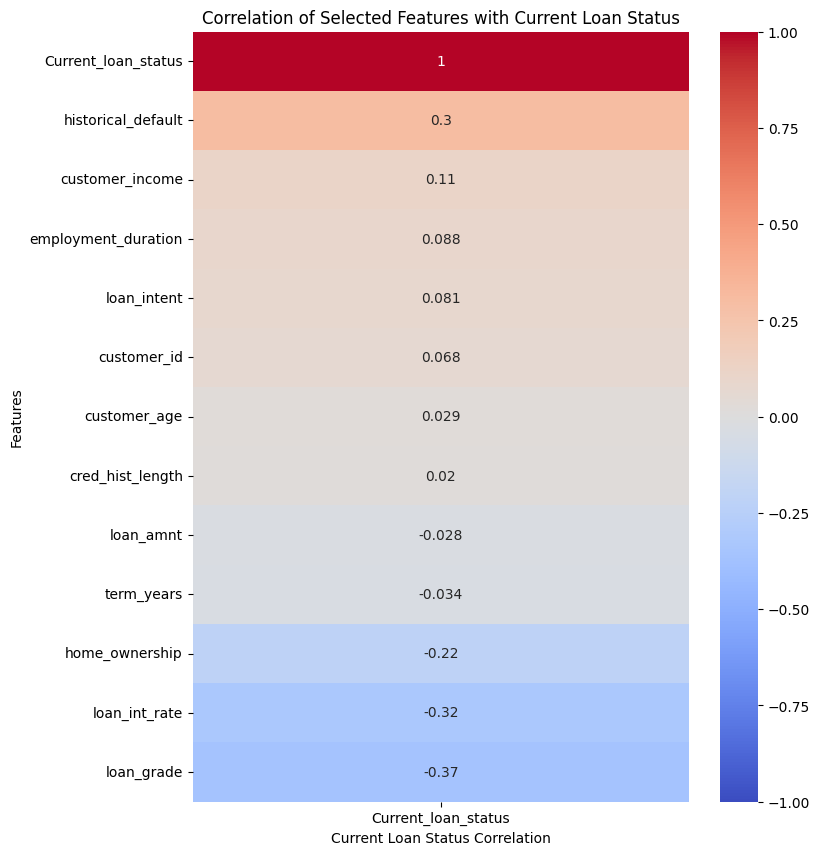

In [ ]:

# all factors
selected_columns = [
    'customer_id', 'customer_age', 'customer_income', 'home_ownership',
    'employment_duration', 'loan_intent', 'loan_grade', 'loan_amnt',
    'loan_int_rate', 'term_years', 'historical_default', 'cred_hist_length',
    'Current_loan_status'
]

# Select these columns from the DataFrame and filter the numeric data
numeric_df = df[selected_columns].select_dtypes(include=['float64', 'int64'])

# correlation matrix
correlation_matrix = numeric_df.corr()

# Select only the correlation to 'Current_loan_status'
correlation_with_target = correlation_matrix[['Current_loan_status']].sort_values(by='Current_loan_status', ascending=False)

# Plot a correlation heatmap
plt.figure(figsize=(8, 10))
sns.heatmap(correlation_with_target, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation of Selected Features with Current Loan Status')
plt.xlabel('Current Loan Status Correlation')
plt.ylabel('Features')
plt.show()

In [ ]:
# use the same random state value to make results comparible
random_state_value = 50

In [ ]:
#decision tree
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation


In [ ]:
df.head()


,customer_id,customer_age,customer_income,home_ownership,employment_duration,loan_intent,loan_grade,loan_amnt,loan_int_rate,term_years,historical_default,cred_hist_length,Current_loan_status,customer_age_range,customer_income_range,loan_amnt_range
0,1.0,22,2955,3,4.0,4,2,35000.0,16.02,10,2,3,0,18-30,2500-3000,30000-35000
1,2.0,21,4211,2,5.0,1,0,1000.0,11.14,1,1,2,1,18-30,4000-4500,0-5000
2,3.0,25,4211,0,1.0,3,1,5500.0,12.87,5,0,3,0,18-30,4000-4500,5000-10000
3,4.0,23,3263,3,4.0,3,1,35000.0,15.23,10,0,2,0,18-30,3000-3500,30000-35000
4,5.0,24,2691,3,8.0,3,1,35000.0,14.27,10,2,4,0,18-30,2500-3000,30000-35000


In [ ]:
#split dataset in features and target variable
feature_cols=['home_ownership','loan_int_rate','loan_grade','historical_default']
#features
x=df[feature_cols]
#target variable
y=df.Current_loan_status

In [ ]:
#split dataset into training set and test set
# 70% training and 30% test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3,random_state=50)


# Create Decision Tree classifer object
clf = DecisionTreeClassifier(random_state=random_state_value)


# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred_dt = clf.predict(x_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_dt))





Accuracy: 0.9146715776550031


In [ ]:
from sklearn.metrics import accuracy_score, classification_report


## calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred_dt)
print(f"accuracy of the model: {accuracy:.4f}")

##classification_report
report = classification_report(y_test, y_pred_dt)
print("\nclassification_report：")
print(report)

accuracy of the model: 0.9147

classification_report：
              precision    recall  f1-score   support

           0       0.77      0.83      0.80      1978
           1       0.96      0.94      0.95      7796

    accuracy                           0.91      9774
   macro avg       0.86      0.88      0.87      9774
weighted avg       0.92      0.91      0.92      9774



In [ ]:
#visualizing decision trees
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,
                feature_names=feature_cols,
                class_names=['Non-default', 'Default'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('loan_default_tree.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.558192 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.558192 to fit



In [ ]:
#optimizing decision tree performance


# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3, random_state=random_state_value)

# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred_dt1 = clf.predict(x_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_dt1))




Accuracy: 0.9014732965009208


In [ ]:
##selecting best depth
#from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
# Define possible max_depth values
param_grid = {'max_depth': range(1, 20)}  # Trying different depths between 1 and 19

# Create a decision tree classifier
clf = DecisionTreeClassifier(criterion='entropy',random_state=random_state_value)

# Use GridSearchCV to search for the best max_depth
grid_search = GridSearchCV(estimator=clf, param_grid=param_grid, cv=5, scoring='accuracy')

# Train the model and find the best parameters
grid_search.fit(x_train, y_train)

#Assign the best model to best_clf
best_clf = grid_search.best_estimator_

# Output the best max_depth
print("Best max_depth:", grid_search.best_params_['max_depth'])

# Output the best accuracy
print("Best accuracy:", grid_search.best_score_)

from sklearn.model_selection import cross_val_predict
from sklearn.metrics import classification_report


# using cross_val_predict for cross-validation predictions.
y_pred_cv = cross_val_predict(clf, x_train, y_train, cv=5)

# output the classification report from cross-validation
report = classification_report(y_train, y_pred_cv)
print("\nCross-Validation Classification Report:")
print(report)

Best max_depth: 9
Best accuracy: 0.9180476623520555

Cross-Validation Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.82      0.80      4858
           1       0.95      0.94      0.95     17948

    accuracy                           0.91     22806
   macro avg       0.87      0.88      0.87     22806
weighted avg       0.92      0.91      0.91     22806



In [ ]:
y_pred_test = best_clf.predict(x_test)
test_report = classification_report(y_test, y_pred_test)
print("\nClassification Report::")
print(test_report)


Classification Report::
              precision    recall  f1-score   support

           0       0.81      0.79      0.80      1978
           1       0.95      0.95      0.95      7796

    accuracy                           0.92      9774
   macro avg       0.88      0.87      0.87      9774
weighted avg       0.92      0.92      0.92      9774



In [ ]:
# adaboost
# load libraries
from sklearn.ensemble import AdaBoostClassifier
from sklearn import datasets
# import train_test_split function
from sklearn.model_selection import train_test_split
# import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

In [ ]:
# split dataset in features and target variable
feature_cols=['home_ownership','loan_int_rate','loan_grade','historical_default']
# features
x=df[feature_cols]
# target variable
y=df.Current_loan_status

In [ ]:
# split dataset into training set and test set
# 70% training and 30% test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3)


In [ ]:
# create adaboost classifer object
abc = AdaBoostClassifier(n_estimators=50,
                         learning_rate=1,random_state=random_state_value)
# train adaboost classifer
model = abc.fit(x_train, y_train)

# predict the response for test dataset
y_pred_ada = model.predict(x_test)


In [ ]:
# examine model accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_ada))


In [ ]:

# Generate classification report
report = classification_report(y_test, y_pred_ada)
print("\nClassification Report:")
print(report)

In [ ]:
#using different base learners
#load libraries
#from sklearn.ensemble import AdaBoostClassifier

# import support vector classifier
#from sklearn.svm import SVC
# import scikit-learn metrics module for accuracy calculation
#from sklearn import metrics
#svc=SVC(probability=True, kernel='linear')

# create adaboost classifer object
#abc =AdaBoostClassifier(n_estimators=10, estimator=svc,learning_rate=1)

# train adaboost classifer
#model = abc.fit(x_train, y_train)

# predict the response for test dataset
#y_pred_ada1= model.predict(x_test)


# model accuracy, how often is the classifier correct?
#print("Accuracy:",metrics.accuracy_score(y_test, y_pred_ada1))


In [ ]:
##randam forest
# data Processing
import pandas as pd
import numpy as np

# modelling
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint

# tree visualisation
from sklearn.tree import export_graphviz
from IPython.display import Image
import graphviz

In [ ]:
# split dataset in features and target variable
feature_cols=['home_ownership','loan_int_rate','loan_grade','historical_default']
# features
x=df[feature_cols]
# target variable
y=df.Current_loan_status
# Split the data into training and test sets (70% training, 30% testing)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=random_state_value)

In [ ]:
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

In [ ]:
y_pred_rf = rf.predict(x_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred_rf)
print("Accuracy:", accuracy)

In [ ]:
#Visualizing the Results
# Export the first three decision trees from the forest

for i in range(3):
    tree = rf.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=x_train.columns,
                               filled=True,
                               max_depth=2,
                               impurity=False,
                               proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

In [ ]:
#Hyperparameter Tuning (search RandomizedSearchCV to optimize the hyperparameters of a Random Forest  )
param_dist = {'n_estimators': randint(50,500),
              'max_depth': randint(1,20)}

# Create a random forest classifier
rf = RandomForestClassifier(random_state=random_state_value)

# Use random search to find the best hyperparameters
rand_search = RandomizedSearchCV(rf,
                                 param_distributions = param_dist,
                                 n_iter=5,
                                 cv=5,random_state=random_state_value)

# Fit the random search object to the data
rand_search.fit(x_train, y_train)

In [ ]:
# Create a variable for the best model
best_rf = rand_search.best_estimator_

# Print the best hyperparameters
print('Best hyperparameters:',  rand_search.best_params_)

In [ ]:


##Use the best hyperparameters to create a new Random Forest model
best_rf = RandomForestClassifier(max_depth=6, n_estimators=120,random_state=random_state_value)

# Train the model on the entire training set
best_rf.fit(x_train, y_train)

# Predict on the test set
y_pred_best_rf = best_rf.predict(x_test)



In [ ]:
# Generate predictions with the best model

# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred_best_rf)

ConfusionMatrixDisplay(confusion_matrix=cm).plot();


In [ ]:
y_pred_best_rf= best_rf.predict(x_test)

accuracy = accuracy_score(y_test, y_pred_best_rf)
precision = precision_score(y_test, y_pred_best_rf)
recall = recall_score(y_test, y_pred_best_rf)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

In [ ]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred_best_rf)
print(f"Accuracy of the model: {accuracy:.4f}")

# Generate classification report
report = classification_report(y_test, y_pred_best_rf)
print("\nClassification Report:")
print(report)

In [ ]:
##Logistic Regression
# data Processing
import pandas as pd
import numpy as np

# modelling
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix


In [ ]:
#split dataset in features and target variable
#features
X = df[['home_ownership', 'loan_int_rate', 'loan_grade', 'historical_default']]
#target variable
y = df['Current_loan_status']
X.head()

In [ ]:
#split dataset into training set and test set
# 70% training and 30% test
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=50)

In [ ]:
#model building
model = LogisticRegression()
model.fit(X_train,y_train)

In [ ]:
#Predict data results and accuracy
y_pred = model.predict(X_test)
y_pred[:20]

In [ ]:
#Predict Probability
y_pred_proba = model.predict_proba(X_test)
y_pred_proba[:5]

In [ ]:
#Calculate accuracy
accuracy = accuracy_score(y_pred,y_test)
print("Accuracy:", accuracy)

In [ ]:
# Generate classification report
report = classification_report(y_test, y_pred)
print("\nClassification Report:")
print(report)

In [ ]:
#ROC curve
from sklearn.metrics import roc_curve
fpr,tpr,thres = roc_curve(y_test,y_pred_proba[:,1])
import matplotlib.pyplot as plt
plt.plot(fpr,tpr)
plt.title('ROC')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.show()

In [ ]:
##Optimization of the Logistic Regression
#Optimization with L1 regularization
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

model_l1 = LogisticRegression(penalty='l1', solver='liblinear')
model_l1.fit(X_train, y_train)
y_pred = model_l1.predict(X_test)
print('Accuracy with L1 regularization:', accuracy_score(y_test, y_pred))

In [ ]:
#Optimization with L2 regularization
model_l2 = LogisticRegression(penalty='l2', solver='lbfgs')
model_l2.fit(X_train, y_train)
y_pred = model_l2.predict(X_test)
print('Accuracy with L2 regularization:', accuracy_score(y_test, y_pred))

In [ ]:
#Optimization with bagging
from sklearn.ensemble import BaggingClassifier

model = BaggingClassifier(estimator=LogisticRegression(max_iter=200), n_estimators=10, random_state=50)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print('Accuracy with bagging:', accuracy_score(y_test, y_pred))

In [ ]:
#Optimization with MLP
from sklearn.neural_network import MLPClassifier

model = MLPClassifier(hidden_layer_sizes=(5,), activation='tanh', max_iter=1000, random_state=50)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print('Accuracy with MLP:', accuracy_score(y_test, y_pred))

In [ ]:
#Generate classification report
report = classification_report(y_test, y_pred)
print("\nClassification Report:")
print(report)

In [ ]:
#final choice
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Assume df is the complete dataset
initial_columns = [
    'customer_age', 'customer_income', 'home_ownership', 'employment_duration',
    'loan_intent', 'loan_grade', 'loan_amnt', 'loan_int_rate', 'term_years',
    'historical_default', 'cred_hist_length', 'Current_loan_status'
]

# Extract initial variables and remove the target variable
df_initial = df[initial_columns].copy()

# Select numeric columns or directly usable columns, explicitly excluding the target variable
numeric_columns = df_initial.select_dtypes(include=['float64', 'int64']).columns.tolist()
selected_columns = [col for col in numeric_columns if col != 'Current_loan_status'] + ['home_ownership', 'loan_intent', 'loan_grade']

# Construct feature matrix X and target variable y
X_initial = df_initial[selected_columns]
y = df_initial['Current_loan_status']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_initial, y, test_size=0.3, random_state=50)

# Train the model using Random Forest
rf_initial = RandomForestClassifier(random_state=50)
rf_initial.fit(X_train, y_train)

# Get and sort feature importances
feature_importances = rf_initial.feature_importances_
features_df = pd.DataFrame({
    'Feature': X_initial.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Print the most important features
print("Feature Importances:\n", features_df)

# Visualize feature importance
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=features_df, palette="Blues_d")
plt.title('Feature Importance in Random Forest Model with Selected Variables')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Predict and evaluate model accuracy
y_pred = rf_initial.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy with Selected Variables:", accuracy)

# Output classification report
print("\nClassification Report with Selected Variables:\n", classification_report(y_test, y_pred))

# Evaluate model stability with cross-validation
cv_scores = cross_val_score(rf_initial, X_initial, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores for Random Forest:", cv_scores)
print("Mean Cross-Validation Accuracy for Random Forest:", cv_scores.mean())

In [ ]:
# Generate and display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()
plt.title("Confusion Matrix for Random Forest Model")
plt.show()

# Evaluate model stability with cross-validation
cv_scores = cross_val_score(rf_initial, X_initial, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores for Random Forest:", cv_scores)
print("Mean Cross-Validation Accuracy for Random Forest:", cv_scores.mean())

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Assume df is the complete dataset
initial_columns = [
    'customer_age', 'customer_income', 'home_ownership', 'employment_duration',
    'loan_intent', 'loan_grade', 'loan_amnt', 'loan_int_rate', 'term_years',
    'historical_default', 'cred_hist_length', 'Current_loan_status'
]

# Extract initial variables and remove the target variable
df_initial = df[initial_columns].copy()

# Select numeric columns or directly usable columns, explicitly excluding the target variable
numeric_columns = df_initial.select_dtypes(include=['float64', 'int64']).columns.tolist()
selected_columns = [col for col in numeric_columns if col != 'Current_loan_status'] + ['home_ownership', 'loan_intent', 'loan_grade']

# Construct feature matrix X and target variable y
X_initial = df_initial[selected_columns]
y = df_initial['Current_loan_status']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_initial, y, test_size=0.3, random_state=50)

# Train the model using Random Forest
rf_initial = RandomForestClassifier(random_state=50)
rf_initial.fit(X_train, y_train)

# Get and sort feature importances
feature_importances = rf_initial.feature_importances_
features_df = pd.DataFrame({
    'Feature': X_initial.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Print the most important features
print("Feature Importances:\n", features_df)

# Set threshold to 0.03 to filter features
threshold = 0.03
important_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()

# Build a new feature matrix with only important features
X_important = df_initial[important_features]

# Split the data into training and test sets
X_train_imp, X_test_imp, y_train, y_test = train_test_split(X_important, y, test_size=0.3, random_state=50)

# Train a new Random Forest model with important features
rf_important = RandomForestClassifier(random_state=50)
rf_important.fit(X_train_imp, y_train)

# Predict on the test set
y_pred_imp = rf_important.predict(X_test_imp)
accuracy_imp = accuracy_score(y_test, y_pred_imp)
print("\nAccuracy with Important Features:", accuracy_imp)

# Output the new classification report
print("\nClassification Report with Important Features:\n", classification_report(y_test, y_pred_imp))

# Use cross-validation to evaluate model stability
cv_scores_imp = cross_val_score(rf_important, X_important, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores for Random Forest with Important Features:", cv_scores_imp)
print("Mean Cross-Validation Accuracy for Random Forest with Important Features:", cv_scores_imp.mean())

# Compare accuracy with full feature set and filtered feature set
if accuracy_imp < accuracy_score(y_test, rf_initial.predict(X_test)):
    print("\nUsing all features yields better accuracy. Skipping feature reduction.")
else:
    print("\nFeature reduction yields similar or improved accuracy.")

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import randint
import matplotlib.pyplot as plt
import seaborn as sns

# Assume df is the complete dataset
initial_columns = [
    'customer_age', 'customer_income', 'home_ownership', 'employment_duration',
    'loan_intent', 'loan_grade', 'loan_amnt', 'loan_int_rate', 'term_years',
    'historical_default', 'cred_hist_length', 'Current_loan_status'
]

# Extract initial variables and remove the target variable
df_initial = df[initial_columns].copy()

# Select numeric columns or directly usable columns, explicitly excluding the target variable
numeric_columns = df_initial.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Construct feature matrix X and target variable y
X_initial = df_initial[selected_columns]
y = df_initial['Current_loan_status']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_initial, y, test_size=0.3, random_state=50)

# Define parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': randint(50, 200),
    'max_depth': randint(5, 20),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 5)
}

# Initialize the random forest model
rf = RandomForestClassifier(random_state=50)

# Use RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(rf, param_distributions=param_dist, n_iter=10, cv=3, scoring='accuracy', random_state=50)
random_search.fit(X_train, y_train)

# Get the best model from random search
best_rf = random_search.best_estimator_

# Predict and evaluate model accuracy on the test set
y_pred = best_rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Optimized Accuracy:", accuracy)

# Output the optimized classification report
print("\nOptimized Classification Report:\n", classification_report(y_test, y_pred))

# Use cross-validation to further evaluate stability
cv_scores = cross_val_score(best_rf, X_initial, y, cv=3, scoring='accuracy')
print("Cross-Validation Scores for Optimized Random Forest:", cv_scores)
print("Mean Cross-Validation Accuracy for Optimized Random Forest:", cv_scores.mean())

# Print the best parameters found
print("Best Parameters from Random Search:", random_search.best_params_)